In [13]:
%load_ext autoreload
%autoreload 2


import scanpy as sc
import seaborn as sns
import pandas as pd
from scipy.stats import median_abs_deviation
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt
import scrublet as scr
from tqdm.notebook import tqdm
from diptest import diptest
from scipy.sparse import csr_matrix
import anndata as ad
import math
import scvi
from dotenv import load_dotenv; load_dotenv()
import json
import os


from utils import preprocessing

# Hyperparamyters
BASE_PATH = os.getenv("BASE_PATH_FOR_SAVING")
DISEASE_TYPE = "diseased" # diseased / healthy
SAMPLE_ID = "sample_01" #"recon_241105"
ADATA_PATH = f'{BASE_PATH}/{DISEASE_TYPE}/{SAMPLE_ID}/adata/all_lib_adata_zoned.h5ad'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load

In [14]:
adata = sc.read_h5ad(ADATA_PATH)
adata

# Only spatial cell in this notebook
adata = adata[adata.obs.has_spatial]
adata

View of AnnData object with n_obs × n_vars = 64914 × 32780
    obs: 'x', 'y', 'pct_intronic', 'is_cell', 'dbscan_clusters', 'dbscan_score', 'has_spatial', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'my_hierarchy_all', 'library', 'library_name', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_scANVI', 'my_grouping_for_zoning', 'zone', 'zone_probability'
    var: 'feature_types', 'genome', 'gene_symbol', 'highly_variable', 'highly_variable_rank', 'm

In [15]:
# OPTIONAL/TEMPORLA


x_max = adata.obs.x.max()
x_mid = int(x_max/2)
x_1_4 = int(x_max/4)      # Center of left slice
x_3_4 = int(3*x_max/4)    # Center of right slice (fixed typo)

y_max = adata.obs.y.max()
y_mid = int(y_max/2)


adata = adata[adata.obs.x > x_mid].copy()

# Show cell type annotations

{'Astrocyte': 'Astrocyte', 'ImAstro': 'ImAstro', 'Ependymal': 'Ependymal', 'B cells': 'B cells', 'T cells': 'T cells', 'BAM': 'BAM', 'Microglia': 'Microglia', 'Monocyte': 'Monocyte', 'COP': 'COP', 'OPC': 'OPC', 'ImOligo': 'ImOligo', 'Oligo OPALIN': 'Oligo OPALIN', 'Oligo PLEKHG1': 'Oligo PLEKHG1', 'Endo': 'Endo', 'Pericyte': 'Pericyte', 'SMC': 'SMC', 'VLMC': 'VLMC', 'BF SKOR1 Glut': 'BF SKOR1 Glut', 'STH PVALB-PITX2 Glut': 'STH PVALB-PITX2 Glut', 'VTR-HTH Glut': 'VTR-HTH Glut', 'SN SOX6 Dopa': 'SN SOX6 Dopa', 'SN-VTR CALB1 Dopa': 'SN-VTR CALB1 Dopa', 'SN-VTR GAD2 Dopa': 'SN-VTR GAD2 Dopa', 'LAMP5-CXCL14 GABA': 'LAMP5-CXCL14 GABA', 'VIP GABA': 'VIP GABA', 'LAMP5-LHX6 GABA': 'LAMP5-LHX6 GABA', 'STRd D1 Matrix MSN': 'STRd D1 Matrix MSN', 'STRd D1 Striosome MSN': 'STRd D1 Striosome MSN', 'STRv D1 MSN': 'STRv D1 MSN', 'STRd D2 Matrix MSN': 'STRd D2 Matrix MSN', 'STRd D2 StrioMat Hybrid MSN': 'STRd D2 StrioMat Hybrid MSN', 'STRd D2 Striosome MSN': 'STRd D2 Striosome MSN', 'STRv D2 MSN': 'STR

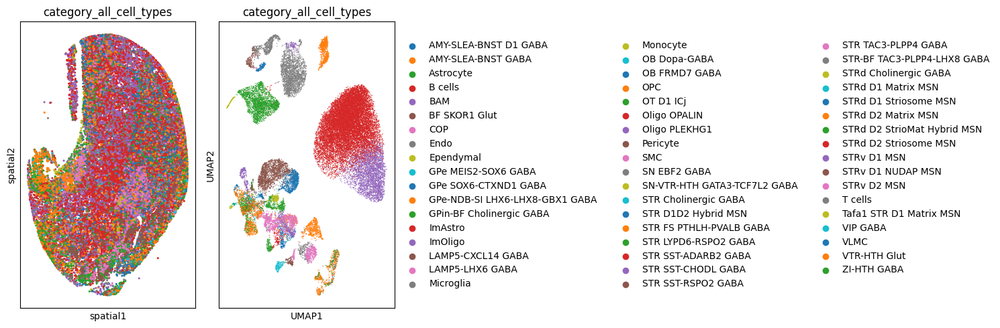

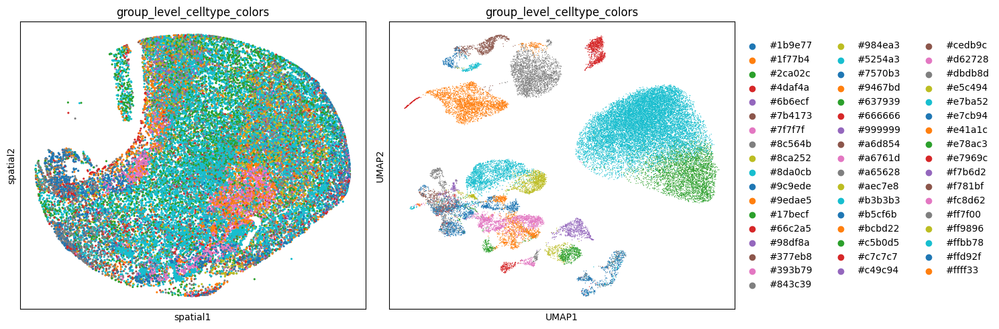

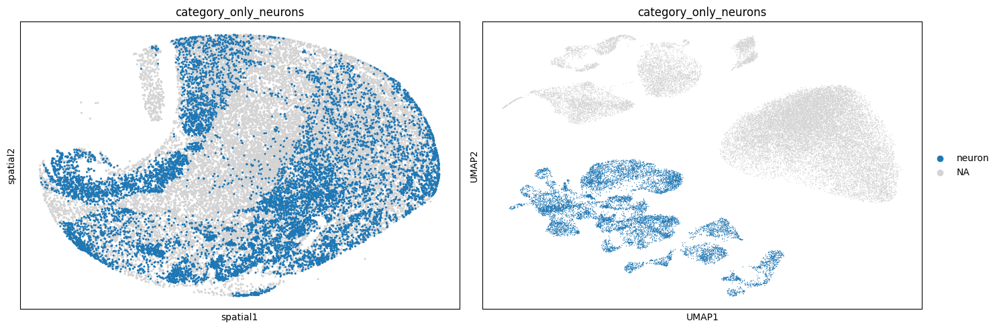

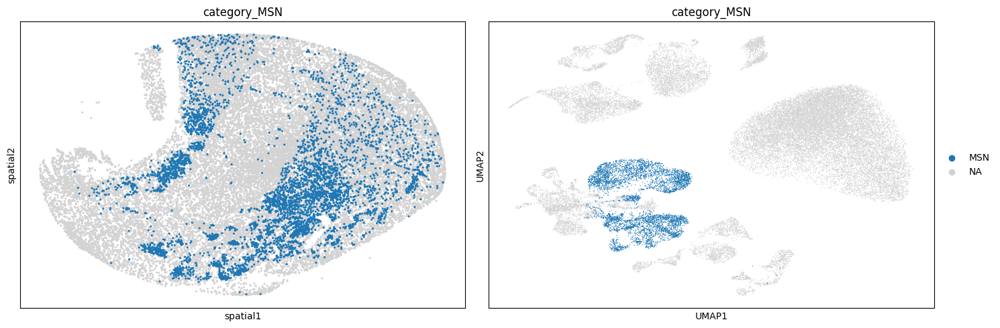

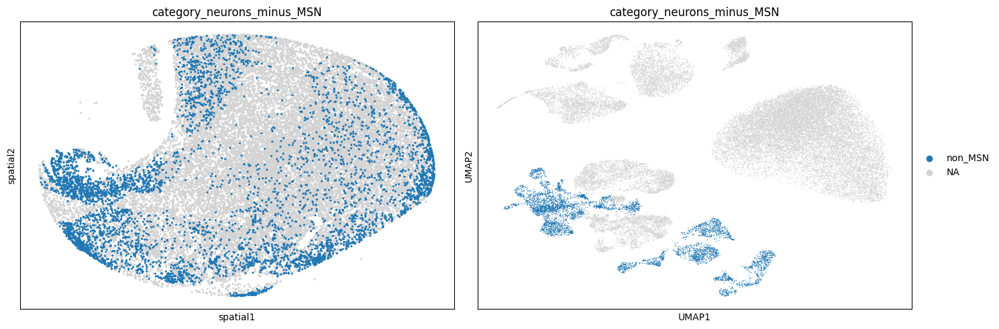

...

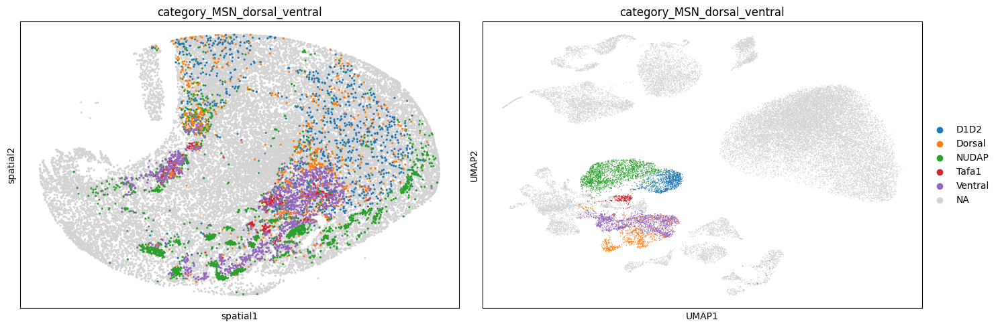

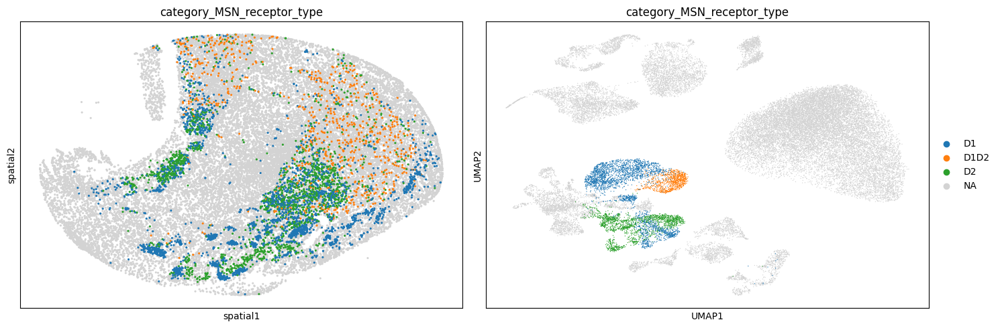

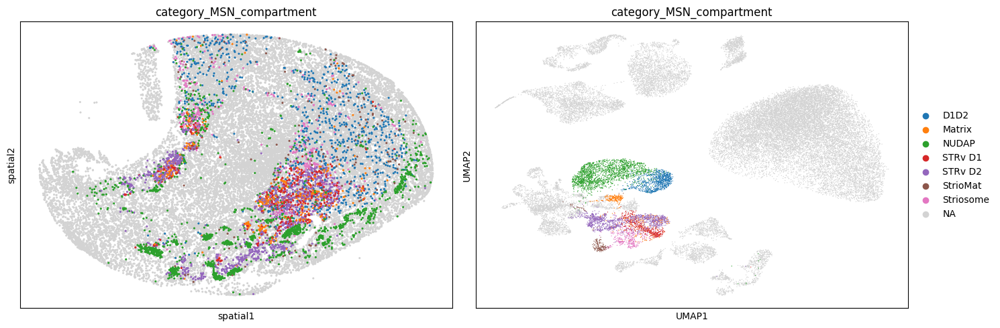

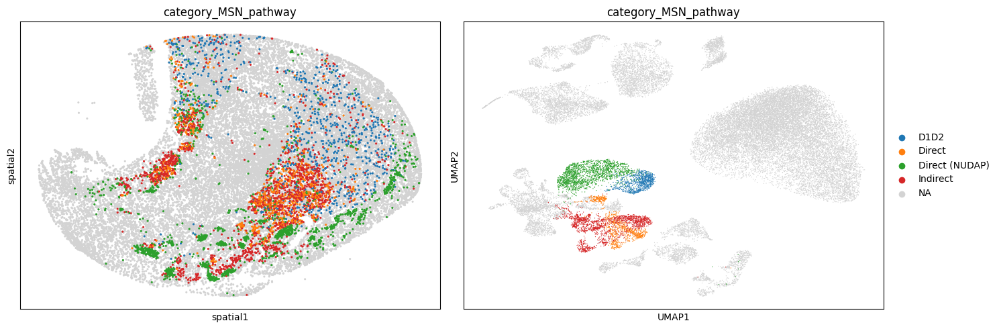

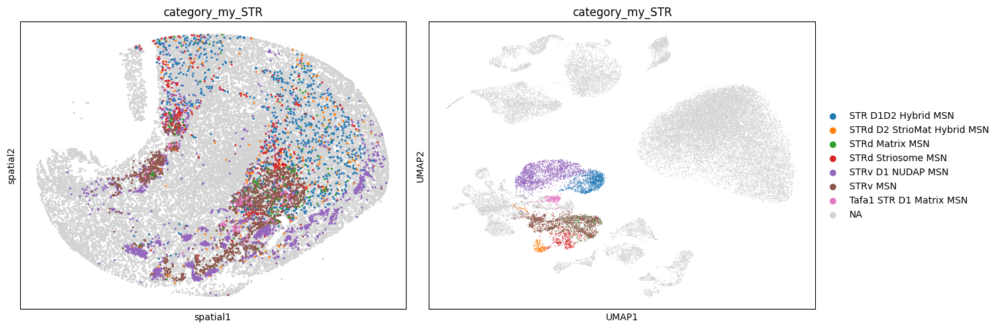

In [16]:
# Load the JSON file
with open(os.getenv("GROUP_LEVEL_MMC_MAPPING_PATH"), 'r') as f:
    classifications = json.load(f)

schemes = list(classifications.keys())

for classification in schemes:
    # Filter out annotation entries (those with keys starting with "_
    clean_mapping = {
        k: v for k, v in classifications[classification].items() 
        if not k.startswith("_")
    }
    print(clean_mapping)
    
    # Apply classification
    adata.obs[classification] = adata.obs['Group_name'].map(clean_mapping)

# Print summary statistics
for scheme in schemes:
    print(f"\n{scheme}:")
    print(f"  Unmapped (NaN): {adata.obs[scheme].isna().sum()}")


for i, res in enumerate(schemes):

    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    sc.pl.embedding(adata, basis="spatial", color=res, ax=axes[0], show=False, legend_loc=None, size=20, palette=sc.pl.palettes.vega_10  ) #     # First plot will generate colors and store them in adata.uns[f'{res}_colors']
    sc.pl.umap(adata, color=res, ax=axes[1], show=False)#, legend_loc="on data") #    # Second plot will automatically use the same colors from adata.uns


    plt.tight_layout()
    plt.show()

KeyError: "['temp_highlight'] not found in axis"

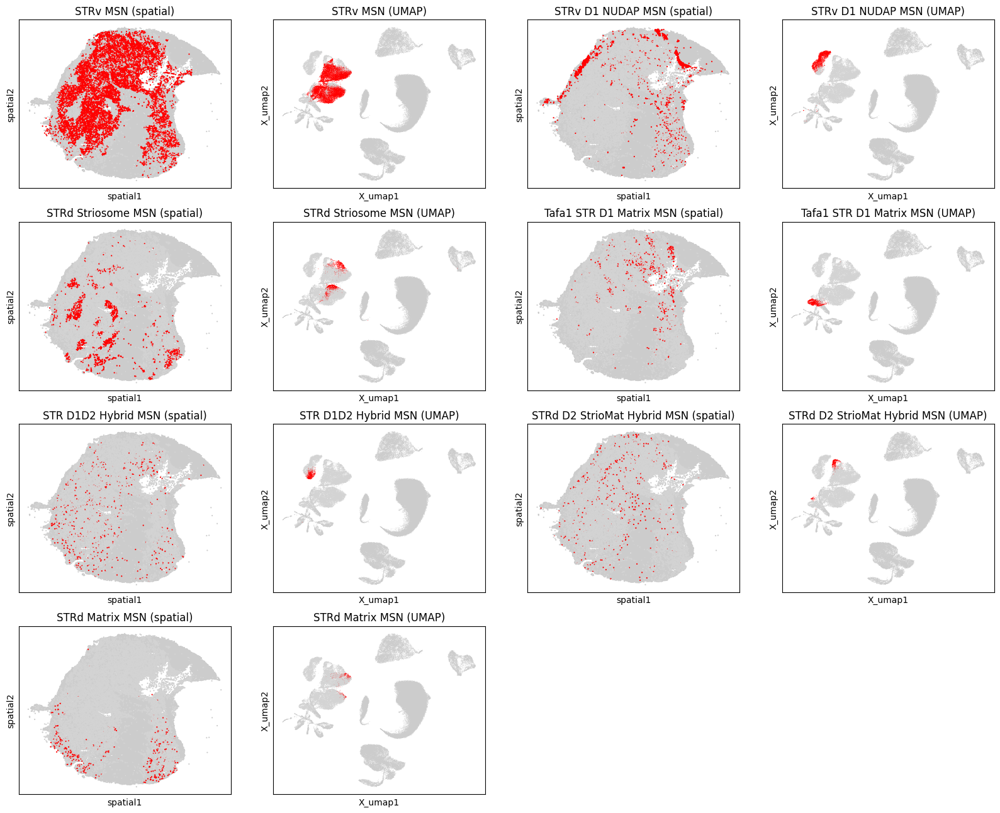

In [ ]:
preprocessing.plot_cell_type(adata, adata, ANNOTATION_LEVEL="category_my_STR")


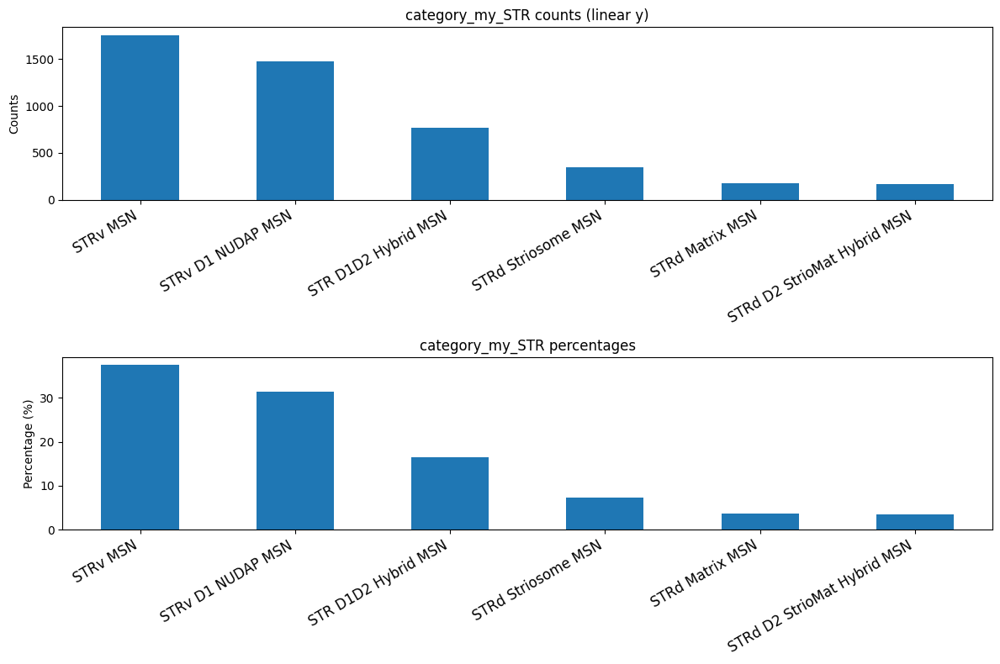

In [ ]:
preprocessing.plot_cell_type_distribution(adata, annotation_levels=["category_my_STR"], dropna=True)


# DEG

In [85]:
# Run rank_genes_groups for ALL clusters (each vs rest)
sc.tl.rank_genes_groups(
    adata_tmp, 
    groupby="leiden_1",  # Compare each leiden cluster vs rest
    method='wilcoxon', 
    corr_method="benjamini-hochberg",
    
    groups=["0"],  
    reference='rest',  # Default is 'rest'
    
    use_raw=False, 
    layer="log1p_norm",
    pts=True,
    
    key_added="leiden_1_DEGs",
    rankby_abs=False
)


# Get results for this cluster
deg_df = sc.get.rank_genes_groups_df(
    adata_tmp, 
    group=["0"], 
    key="leiden_1_DEGs"
)

# Filter DEGs
deg_filtered = deg_df[
    (deg_df.pvals_adj < 0.05) &
    #(np.abs(deg_df.logfoldchanges) > 1) &
    (deg_df.logfoldchanges > 1) &
    (deg_df['pct_nz_group'] > 0.25) &  # only test genes that are detected in a minimum fraction  IN cluster
    (deg_df['pct_nz_reference'] < 0.20)  # only test genes NOT expressed outside
].copy()
    
# Mapo gene
gene_symbol_map = adata.var["gene_symbol"].to_dict()
deg_filtered["gene_symbol"] = deg_filtered["names"].map(gene_symbol_map)

print(f"\nTotal DEGs across all clusters: {len(deg_filtered)}")
deg_filtered


Total DEGs across all clusters: 136


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,gene_symbol
0,ENSG00000183662,19.322184,7.669405,3.495450e-83,1.145809e-78,0.962963,0.062241,TAFA1
11,ENSG00000157542,17.715469,4.829944,3.185555e-70,5.495920e-67,0.915344,0.114108,KCNJ6
12,ENSG00000081803,17.223141,5.896428,1.780604e-66,2.779438e-63,0.873016,0.056017,CADPS2
13,ENSG00000185736,17.068401,5.775581,2.550897e-65,3.800837e-62,0.878307,0.076763,ADARB2
15,ENSG00000181234,16.460073,5.858001,7.101518e-61,8.027164e-58,0.835979,0.047718,TMEM132C
...,...,...,...,...,...,...,...,...
1082,ENSG00000089847,2.962614,1.356084,3.050390e-03,3.463519e-02,0.291005,0.174274,ANKRD24
1092,ENSG00000246695,2.939148,1.122285,3.291154e-03,3.699726e-02,0.317460,0.192946,RASSF8-AS1
1118,ENSG00000069018,2.878271,1.388111,3.998611e-03,4.382295e-02,0.259259,0.126556,TRPC7
1130,ENSG00000015592,2.856798,1.215544,4.279377e-03,4.634224e-02,0.306878,0.197095,STMN4


In [98]:
import gseapy as gp


# Get gene list (use gene symbols)
cluster0_genes = deg_filtered['gene_symbol'].dropna().tolist()[:]
print(f"Running enrichment on {len(cluster0_genes)} genes...")

# Run Enrichr
enr = gp.enrichr(
    gene_list=cluster0_genes,
    gene_sets=['GO_Biological_Process_2023', 'GO_Cellular_Component_2023', 
               'KEGG_2021_Human', 'MSigDB_Hallmark_2020'],
    organism='human',
    outdir=None,  # Don't save files
)

# Display top results
print("\n=== Top Enriched Pathways ===")
display(enr.results[enr.results["Adjusted P-value"] <= 0.05].head(20))



Running enrichment on 136 genes...

=== Top Enriched Pathways ===


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes


# Check cell type annotatation markers

In [ ]:


markers = {
    celltype: [g for g in genes if g in set(adata.var["gene_symbol"])]
    for celltype, genes in markers.items()
}

In [114]:
for cell_type, genes in tqdm(markers.items()):

    genes_ensamble_name = adata.var[adata.var.gene_symbol.isin(genes)].index.to_list()
    
    if len(genes) > 0:
        sc.tl.score_genes(adata, genes_ensamble_name, score_name=f'{cell_type}_score', use_raw=False, layer="log1p_norm") # normalised scores (not scaled)
    else:
        print(f"  ⚠ {cell_type}: No markers found!")

  0%|          | 0/5 [00:00<?, ?it/s]

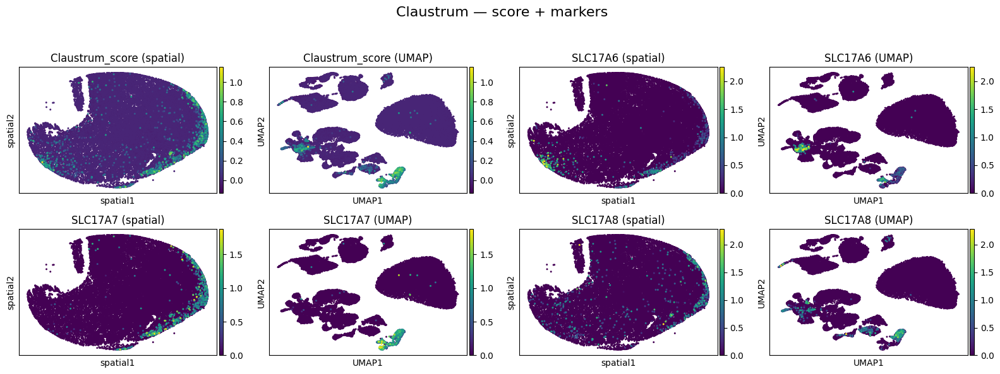

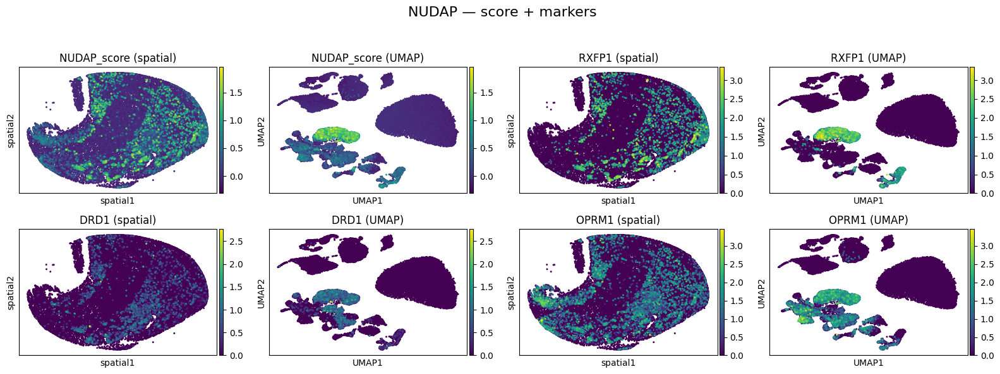

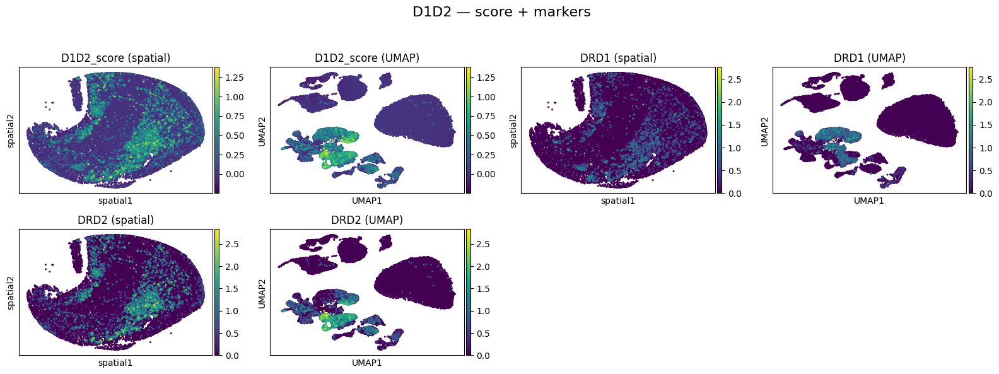

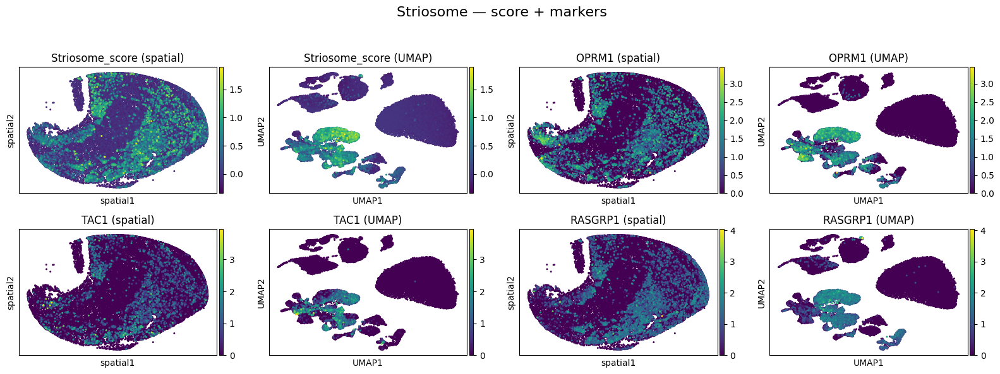

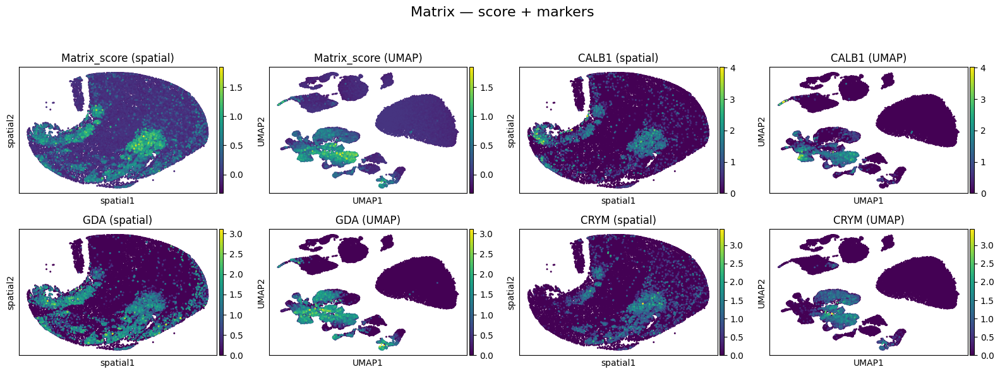

In [115]:
import math
import matplotlib.pyplot as plt
import scanpy as sc

def plot_score_then_genes(adata, markers, layer="log1p_norm", size=18, gene_symbols="gene_symbol"):
    """
    For each cell-type in `markers`:
      - first pair: module score (obs named f"{celltype}_score"), plotted as spatial + UMAP
      - following pairs: each gene -> (spatial, UMAP)
    Layout: 4 columns (2 pairs) per row.
    """
    for celltype, genes in markers.items():
        # prepare axes grid
        total_panels = 2 + 2 * len(genes)            # 2 for score, 2 per gene
        n_rows = math.ceil(total_panels / 4)
        fig, axes = plt.subplots(n_rows, 4, figsize=(16, 3 * n_rows))
        axes_flat = axes.flatten() if hasattr(axes, "flatten") else [axes]

        # 1) module score (must be in adata.obs as f"{celltype}_score")
        score_name = f"{celltype}_score"
        # spatial
        sc.pl.embedding(adata, basis="spatial", color=score_name, ax=axes_flat[0],
                        show=False, size=size, layer=None, title=f"{score_name} (spatial)")
        # umap
        sc.pl.umap(adata, color=score_name, ax=axes_flat[1],
                   show=False, size=size, layer=None, title=f"{score_name} (UMAP)")

        # 2) genes (placed after the score panels)
        start_idx = 2
        for i, gene in enumerate(genes):
            idx_sp = start_idx + i * 2
            idx_um = idx_sp + 1
            if idx_sp < len(axes_flat):
                sc.pl.embedding(adata, basis="spatial", color=gene, ax=axes_flat[idx_sp],
                                show=False, size=size, layer=layer, gene_symbols=gene_symbols,
                                title=f"{gene} (spatial)")
            if idx_um < len(axes_flat):
                sc.pl.umap(adata, color=gene, ax=axes_flat[idx_um],
                           show=False, size=size, layer=layer, gene_symbols=gene_symbols,
                           title=f"{gene} (UMAP)")

        # hide any unused axes
        used = 2 + 2 * len(genes)
        for ax in axes_flat[used:]:
            ax.axis("off")

        fig.suptitle(f"{celltype} — score + markers", fontsize=16)
        plt.tight_layout(rect=[0, 0, 1, 0.94])
        plt.show()


plot_score_then_genes(adata, markers)


# Interferon

In [12]:
cts = ["Microglia", "T cells", "BAM", "ImAstro", "Astrocyte", "Endo", "Pericyte", "VLMC", "SMC"]
cts = adata.obs["Class_name"].unique().to_list()


/tmp/ipykernel_640709/3043948288.py:2: FutureWarning: Categorical.to_list is deprecated and will be removed in a future version. Use obj.tolist() instead
  cts = adata.obs["Class_name"].unique().to_list()


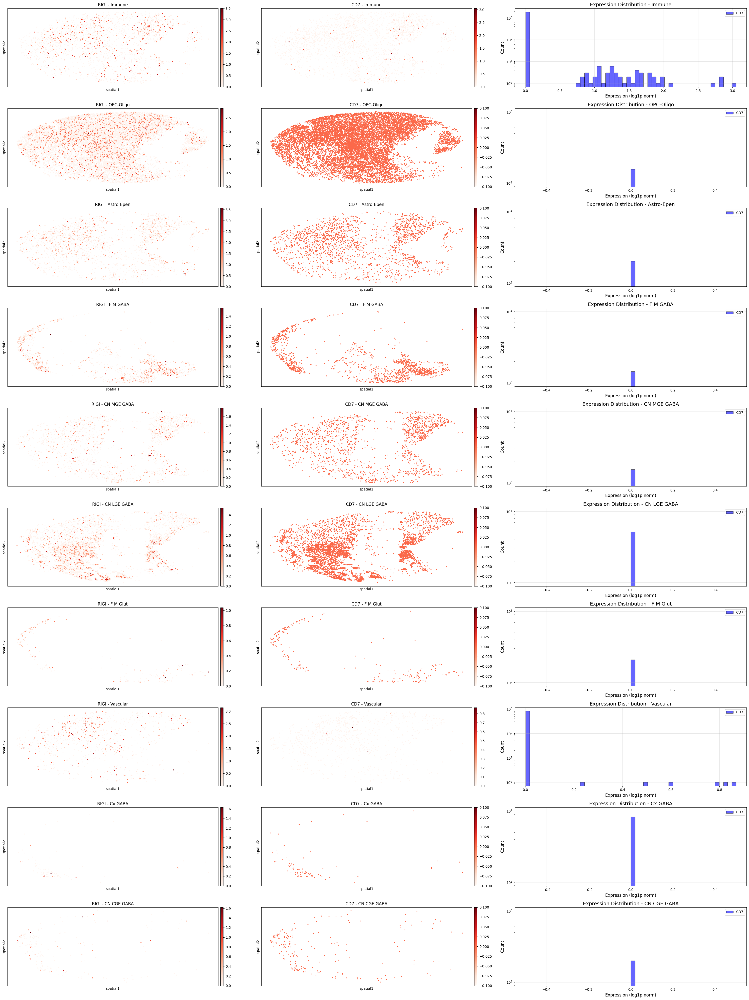

In [13]:
fig, axes = plt.subplots(len(cts), 3, figsize=(30, 40))

for i, ct in enumerate(cts):
    adata_spatial_ct = adata[adata.obs["Class_name"] == ct]
    
    # Plot spatial for each gene
    for j, gene in enumerate(["RIGI", "CD7"]):
        sc.pl.embedding(adata_spatial_ct, basis="spatial", color=gene, 
                        gene_symbols="gene_symbol", vmin=0,
                        layer="log1p_norm", show=False, size=30, cmap="Reds", 
                        ax=axes[i, j])
        axes[i, j].set_title(f"{gene} - {ct}")
    
    # Column 2: Histogram of gene expression for this cell type
    for gene, color in zip(["CD7"], ["blue"]):
        gene_idx = adata_spatial_ct.var[adata_spatial_ct.var.gene_symbol == gene].index[0]
        gene_expr = adata_spatial_ct[:, gene_idx].layers["log1p_norm"].toarray().flatten()
        
        axes[i, 2].hist(gene_expr, bins=50, alpha=0.6, label=gene, color=color, edgecolor='black')
    
    axes[i, 2].set_xlabel("Expression (log1p norm)", fontsize=12)
    axes[i, 2].set_ylabel("Count", fontsize=12)
    axes[i, 2].set_title(f"Expression Distribution - {ct}", fontsize=14)
    axes[i, 2].legend()
    axes[i, 2].grid(alpha=0.3)
    axes[i, 2].set_yscale("log")

plt.tight_layout()
plt.show()

# Find Line (LOD)

** Manually **

In [29]:
CELL_TYPE_FOR_LOD = "STRv MSN" #"Matrix SPN"
CELL_TYPE_ANNOTATION_LOD = "category_STR"

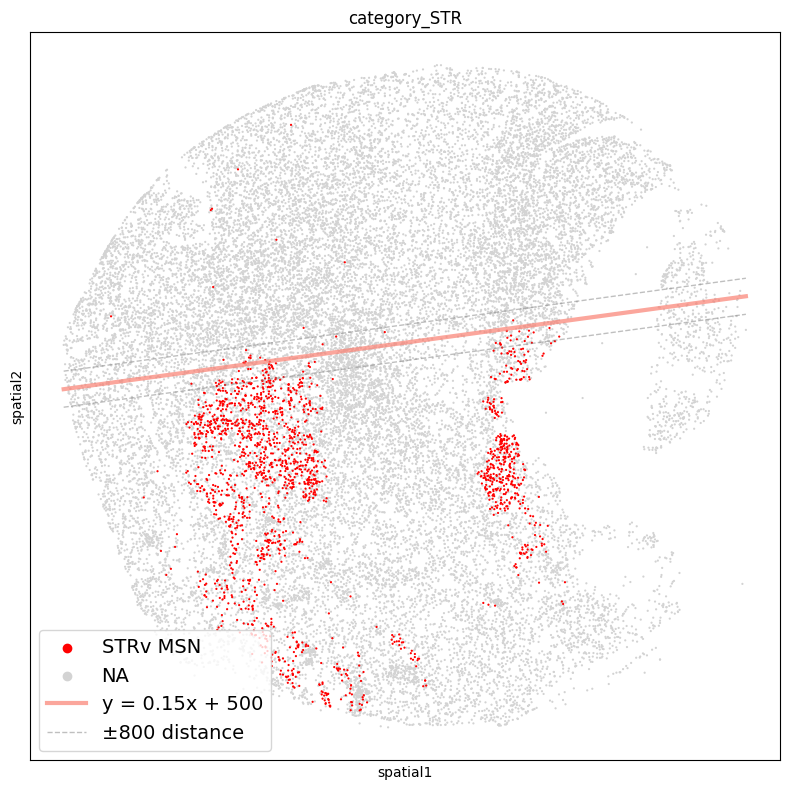

LOD_region
intact         13857
degenerated    13060
LOD             2127
Name: count, dtype: int64


In [33]:
# Set parameters
slope = 0.15
intercept = 500
C = 800

# Save
adata.uns['boundary_line'] = {
    'slope': slope, 
    'intercept': intercept,
    'equation': f"y = {slope}x + {intercept}",
    'C': C,
}

# Distance each cell from the line
coords = adata.obsm['spatial']
x = coords[:, 0]
y = coords[:, 1]
adata.obs["distances_from_LOD"] = np.abs(slope * x - y + intercept) / np.sqrt(slope**2 + 1)

# Add col
adata.obs['LOD_region'] = [
    "LOD" if d < C
    else ("degenerated" if y_val > (slope * x_val + intercept) else "intact")
    for d, x_val, y_val in zip(
        adata.obs["distances_from_LOD"],
        x,
        y
    )
]

# Plot function
def plot_boundary(adata, color='my_hierarchy', groups=None):
    fig, ax = plt.subplots(figsize=(8, 8))

    colors = {c: "lightgray" for c in adata.obs[CELL_TYPE_ANNOTATION_LOD].cat.categories}
    colors[CELL_TYPE_FOR_LOD] = "red"
    sc.pl.embedding(adata, basis='spatial', color=color, groups=groups, 
                   size=10, ax=ax, show=False, palette=colors)
    
    b = adata.uns['boundary_line']
    coords = adata.obsm['spatial']
    x_line = np.linspace(coords[:, 0].min(), coords[:, 0].max(), 100)
    y_line = b['slope'] * x_line + b['intercept']

    # Main line
    ax.plot(x_line, y_line, 'salmon', linewidth=3, alpha=0.7, label=b['equation'])

    # Distance bands (±C)
    y_upper = y_line + b['C'] * np.sqrt(1 + b['slope']**2)
    y_lower = y_line - b['C'] * np.sqrt(1 + b['slope']**2)
    ax.plot(x_line, y_upper, 'grey', linewidth=1, linestyle='--', alpha=0.5, label=f'±{b["C"]} distance')
    ax.plot(x_line, y_lower, 'grey', linewidth=1, linestyle='--', alpha=0.5)

    ax.legend(fontsize=14)
    plt.tight_layout()
    plt.show()

# Use it - plot different colors
plot_boundary(adata, color=CELL_TYPE_ANNOTATION_LOD, groups=[CELL_TYPE_FOR_LOD])

# Check counts
print(adata.obs['LOD_region'].value_counts())

# Density
Density = Number of cells / Area

## Define regions and calcualte area

here use convex hull --> in future need spcific anatomical regions

In [34]:
CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY = "category_STR" #"category_only_SPN"

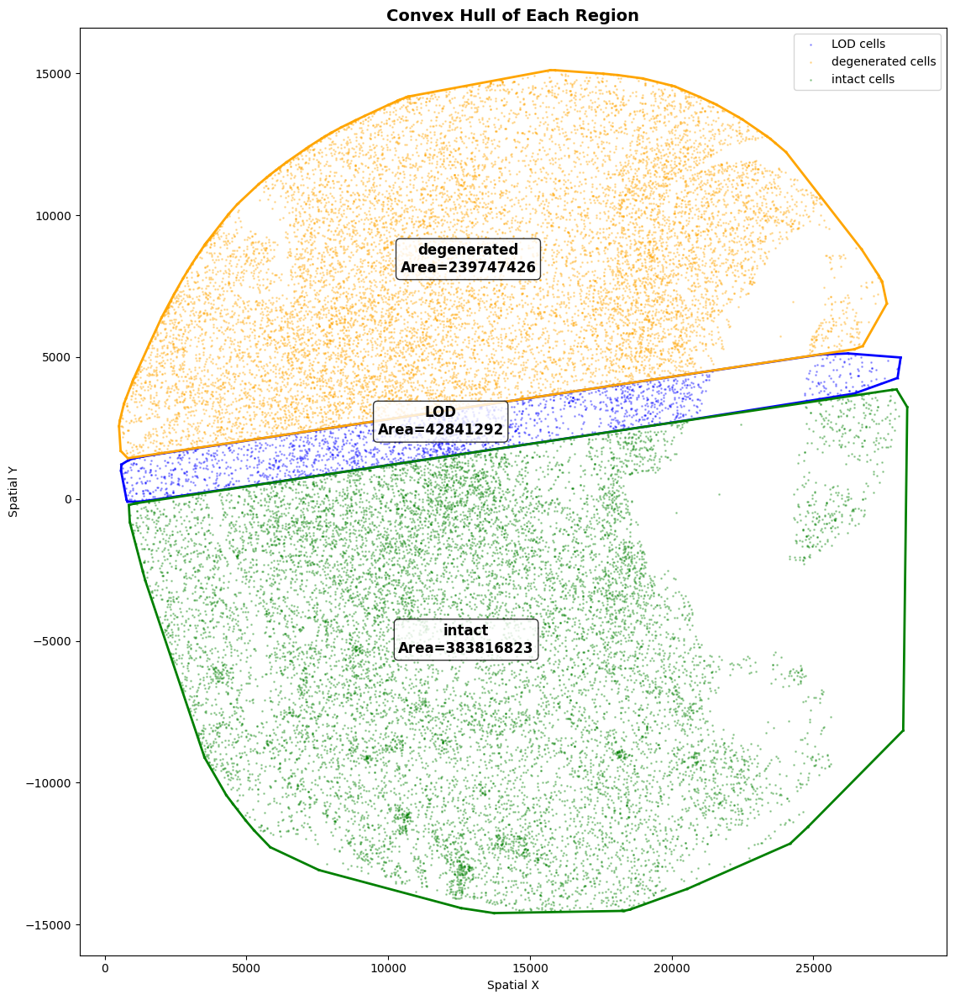

In [35]:

from scipy.spatial import ConvexHull
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(12, 12))

colors = {'LOD': 'blue', 'degenerated': 'orange', 'intact': 'green'}

for region in ['LOD', 'degenerated', 'intact']:
    # Get coordinates
    mask = adata.obs['LOD_region'] == region
    coords = adata.obsm['spatial'][mask]
    
    # Plot all cells
    ax.scatter(coords[:, 0], coords[:, 1], 
              c=colors[region], alpha=0.3, s=1, label=f'{region} cells')
    
    # Calculate and plot convex hull
    hull = ConvexHull(coords)
    
    # Get hull boundary points
    for simplex in hull.simplices:
        ax.plot(coords[simplex, 0], coords[simplex, 1], 
               colors[region], linewidth=2)
    
    # Calculate area
    area = hull.volume
    ax.text(coords[:, 0].mean(), coords[:, 1].mean(), 
           f'{region}\nArea={area:.0f}', 
           fontsize=12, fontweight='bold', ha='center',
           bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

ax.set_xlabel('Spatial X')
ax.set_ylabel('Spatial Y')
ax.set_title('Convex Hull of Each Region', fontsize=14, fontweight='bold')
ax.legend()
ax.set_aspect('equal')
plt.tight_layout()
plt.show()

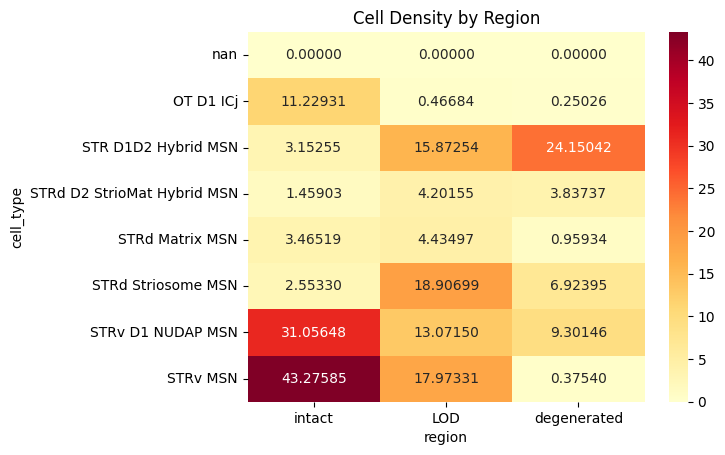

In [36]:
# Quick density calculation
from scipy.spatial import ConvexHull
# ConvexHull calculates the smallest convex polygon that contains all points

results = []
for region in ['LOD', 'degenerated', 'intact']:

    #Get all spatial coordinates for this region
    coords = adata.obsm['spatial'][adata.obs['LOD_region'] == region]

    # Calculate the AREA of this region
    area = ConvexHull(coords).volume / 10000000 #.volume returns area (confusing name!)
    #print(area)
    
    for ct in adata.obs[CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY].unique():
        # Count how many cells of this type are in this region
        n_cells = ((adata.obs['LOD_region'] == region) & 
                   (adata.obs[CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY] == ct)).sum()
        results.append({'region': region, 'cell_type': ct, 
                       'density': n_cells / area})

density_df = pd.DataFrame(results)
density_table = density_df.pivot(
    index='cell_type', # Rows = cell types
    columns='region', 
    values='density')

density_table = density_table[["intact", "LOD", "degenerated"]]

# Heatmap
sns.heatmap(density_table, annot=True, fmt='.5f', cmap='YlOrRd')
plt.title('Cell Density by Region')
plt.show()

In [48]:
adata.obs[CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY].unique().tolist()[1:]

['STRv MSN',
 'OT D1 ICj',
 'STRd Striosome MSN',
 'STRv D1 NUDAP MSN',
 'STR D1D2 Hybrid MSN',
 'STRd Matrix MSN',
 'STRd D2 StrioMat Hybrid MSN']

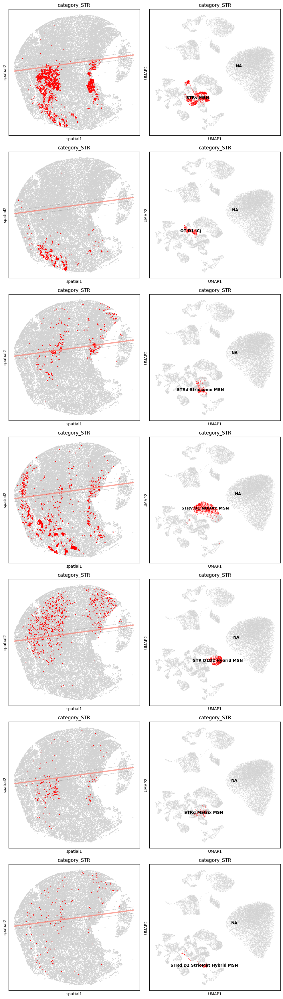

In [50]:
# Investigate regiosn where tehre is biggets chnage
cts = adata.obs[CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY].unique().tolist()[1:]#["STR D1D2 Hybrid MSN", "STRd Matrix MSN", "STRd Striosome MSN"]

fig, axes = plt.subplots(len(cts), 2, figsize=(10, 5*len(cts)))

for i, ct in enumerate(cts):
    colors = {c: "lightgray" for c in adata.obs[CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY].cat.categories}
    colors[ct] = "red"
    sc.pl.embedding(adata, basis="spatial", color=CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY, ax=axes[i, 0], show=False, legend_loc=None, size=20, groups=ct, palette=colors)
    sc.pl.umap(adata, color=CELL_TYPE_ANNOTATION_FOR_DEG_DENSITY, ax=axes[i, 1], show=False, legend_loc="on data", groups=ct, palette=colors)



    b = adata.uns['boundary_line']
    coords = adata.obsm['spatial']
    x_line = np.linspace(coords[:, 0].min(), coords[:, 0].max(), 100)
    y_line = b['slope'] * x_line + b['intercept']

    ax.plot(x_line, y_line, 'salmon', linewidth=3, alpha=0.7, label=b['equation'])
    y_upper = y_line + b['C'] * np.sqrt(1 + b['slope']**2)
    y_lower = y_line - b['C'] * np.sqrt(1 + b['slope']**2)

    # Main line
    axes[i, 0].plot(x_line, y_line, 'salmon', linewidth=3, alpha=0.7, label=b['equation'])
    axes[i, 0].plot(x_line, y_upper, 'grey', linewidth=1, linestyle='--', alpha=0.5, label=f'±{b["C"]} distance')
    axes[i, 0].plot(x_line, y_lower, 'grey', linewidth=1, linestyle='--', alpha=0.5)


plt.tight_layout()
plt.show()

# DEGs: Degenerated Vs Intact

In [66]:
CELL_TYPE_ANNOTATION_FOR_DEG_LOD = "category_only_SPN" #all_cell_types"
CONTRAST = ["degenerated", "intact"] #["LOD", "intact"]
MIN_CELLS_PER_GROUP = 5

In [67]:
# Find marker genes for each cluster (equivalent to FindAllMarkers)
    # need log normlsied data --< NPY scaled
    # DEG: cluster Vs rest

deg_lod_lod_vs_intact = []

for ct in tqdm(adata.obs[CELL_TYPE_ANNOTATION_FOR_DEG_LOD].unique().tolist()):

    # filter cell type and location
    adata_ct = adata[
        (adata.obs[CELL_TYPE_ANNOTATION_FOR_DEG_LOD] == ct) &
        (adata.obs["LOD_region"].isin(CONTRAST))
        ].copy()
    
    # Remove unused categories after filtering
    adata_ct.obs["LOD_region"] = adata_ct.obs["LOD_region"].cat.remove_unused_categories()
    
    # if no cells in each region
    counts = adata_ct.obs["LOD_region"].value_counts()
    if not all(region in counts.index for region in CONTRAST):
        print(f"{ct}: missing regions. Found: {counts.index.tolist()}")
        continue
    # Check minimum cells per group
    if any(counts[region] < MIN_CELLS_PER_GROUP for region in CONTRAST):
        print(f"{ct}: too few cells. LOD={counts.get('LOD', 0)}, intact={counts.get('intact', 0)} (min={MIN_CELLS_PER_GROUP})")
        continue
    
    sc.tl.rank_genes_groups(
        adata_ct, 
        groupby="LOD_region",  # already filtering by cell type
        method='wilcoxon', 
        corr_method="benjamini-hochberg",

        groups=[CONTRAST[0]],
        reference=CONTRAST[1], 

        use_raw=False, 
        layer="log1p_norm", #ATTNETION: NOT scaled data in X

        pts = True, # ATTENTION; % cells expressing gene IN and OUT cluster 

        key_added="_".join(CONTRAST),

        rankby_abs=False
    )

    # Get top genes for this cluster
    deg_results_df = sc.get.rank_genes_groups_df(adata_ct, group=CONTRAST[0], key="_".join(CONTRAST))

    # Filer
    deg_results_df = deg_results_df[
        (deg_results_df.pvals_adj < 0.05) &
        (np.abs(deg_results_df.logfoldchanges) > 1) & # ATTENTION: both directions
        (deg_results_df['pct_nz_group'] > 0.1)   # only test genes that are detected in a minimum fraction  IN cluster

        # not apply here
        # (deg_results_df.scores > 0) &
        # (deg_results_df['pct_nz_reference'] < 0.50) & # only test genes NOT expressed outside
        # ((deg_results_df['pct_nz_group'] - deg_results_df['pct_nz_reference']) > 0.10) # Gene must be >10% more frequent in cluster than outside  
    ] 

    deg_results_df["cell_type"] = ct

    deg_lod_lod_vs_intact.append(deg_results_df)

# concat
deg_lod_lod_vs_intact = pd.concat(deg_lod_lod_vs_intact, ignore_index=True)

# mape gene naems
gene_symbol_map = adata.var["gene_symbol"].to_dict()
deg_lod_lod_vs_intact["gene_symbol"] = deg_lod_lod_vs_intact["names"].map(gene_symbol_map)

# Add regulation direction
deg_lod_lod_vs_intact["direction"] = deg_lod_lod_vs_intact["logfoldchanges"].apply(
    lambda x: "UP in LOD" if x > 0 else "DOWN in LOD"
)

deg_lod_lod_vs_intact["-log10p"] = -np.log10(deg_lod_lod_vs_intact["pvals_adj"])


deg_lod_lod_vs_intact

  0%|          | 0/10 [00:00<?, ?it/s]

nan: missing regions. Found: []
STRv D2 MSN: too few cells. LOD=0, intact=1037 (min=5)


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,cell_type,gene_symbol,direction,-log10p
0,ENSG00000112541,9.591968,1.577414,8.642100e-22,2.832880e-17,1.000000,STRd D1 Striosome MSN,PDE10A,UP in LOD,16.547772
1,ENSG00000164741,8.980527,1.739311,2.694720e-19,2.944430e-15,0.987952,STRd D1 Striosome MSN,DLC1,UP in LOD,14.530999
2,ENSG00000159023,8.980527,1.843056,2.694720e-19,2.944430e-15,0.987952,STRd D1 Striosome MSN,EPB41,UP in LOD,14.530999
3,ENSG00000120549,8.791363,2.979860,1.477562e-18,1.210862e-14,0.987952,STRd D1 Striosome MSN,KIAA1217,UP in LOD,13.916905
4,ENSG00000182621,8.640414,1.240523,5.600979e-18,3.060001e-14,1.000000,STRd D1 Striosome MSN,PLCB1,UP in LOD,13.514278
...,...,...,...,...,...,...,...,...,...,...
1394,ENSG00000163618,-7.690050,-1.086650,1.470775e-14,1.928480e-11,0.989130,STRd D2 StrioMat Hybrid MSN,CADPS,DOWN in LOD,10.714785
1395,ENSG00000231764,-8.128917,-2.658423,4.331439e-16,8.874036e-13,0.652174,STRd D2 StrioMat Hybrid MSN,DLX6-AS1,DOWN in LOD,12.051879
1396,ENSG00000182348,-8.168454,-6.151474,3.123659e-16,7.313825e-13,0.108696,STRd D2 StrioMat Hybrid MSN,ZNF804B,DOWN in LOD,12.135855
1397,ENSG00000182050,-8.192177,-2.910539,2.565436e-16,6.468845e-13,0.565217,STRd D2 StrioMat Hybrid MSN,MGAT4C,DOWN in LOD,12.189173



Total DEGs: 1399
  UP in LOD: 711
  DOWN in LOD: 688


STRd D1 Striosome MSN: 212 DEGs (↑131 / ↓81)


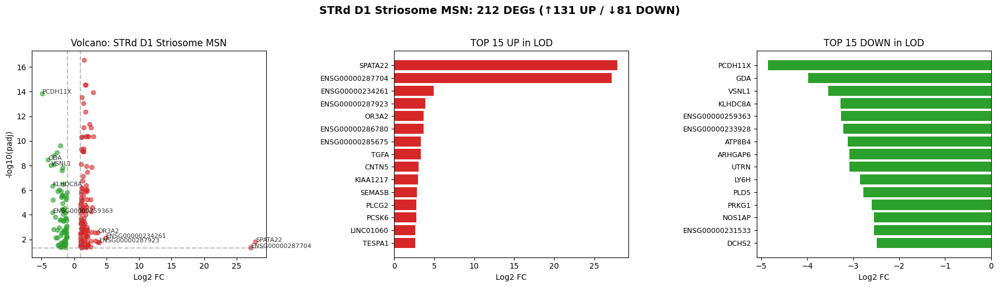


STRv D1 NUDAP MSN: 155 DEGs (↑78 / ↓77)


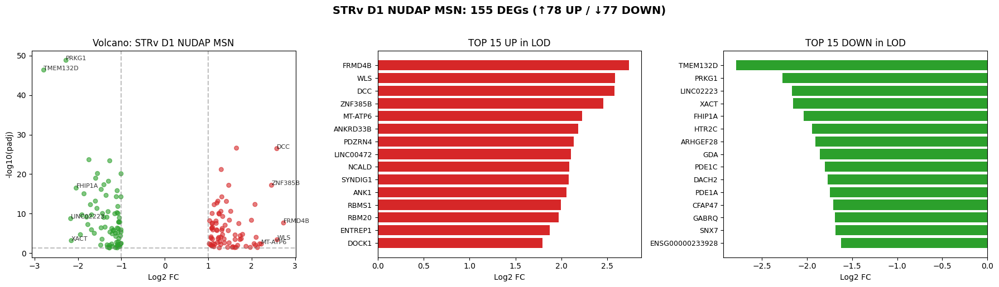


STR D1D2 Hybrid MSN: 182 DEGs (↑40 / ↓142)


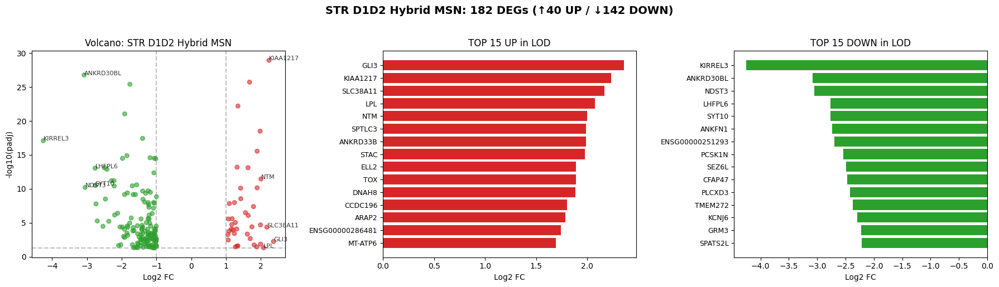


STRd D2 Matrix MSN: 27 DEGs (↑13 / ↓14)


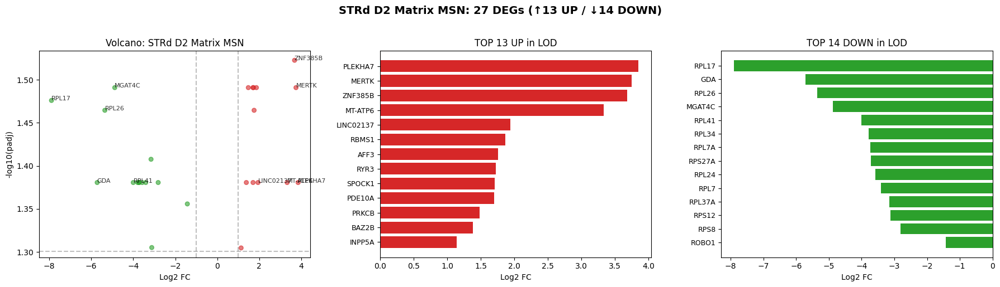


STRd D2 Striosome MSN: 181 DEGs (↑68 / ↓113)


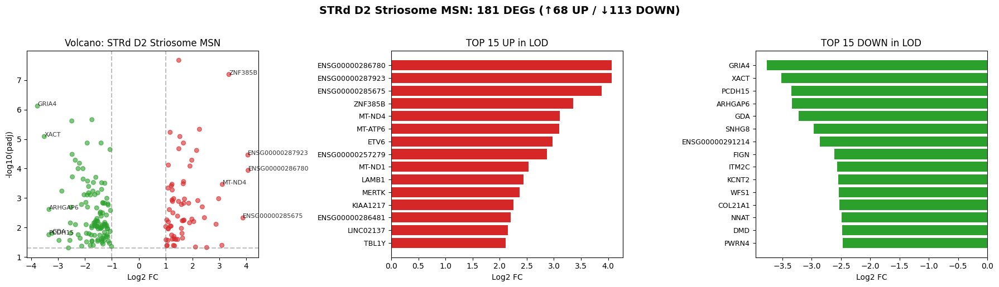


STRd D2 StrioMat Hybrid MSN: 642 DEGs (↑381 / ↓261)


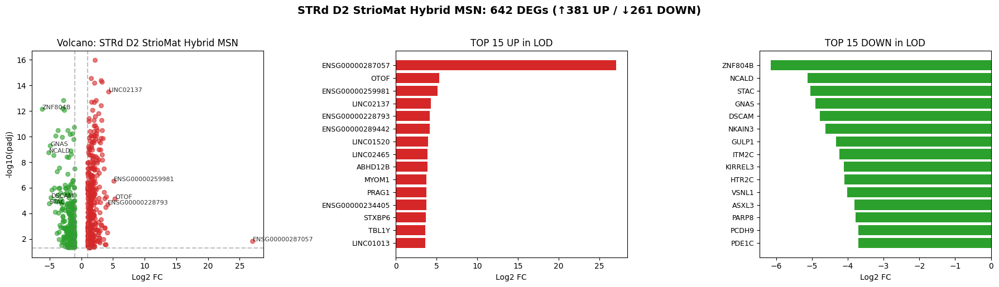


SUMMARY TABLE
direction                    DOWN in LOD  UP in LOD  Total
cell_type                                                 
STRd D2 StrioMat Hybrid MSN          261        381    642
STRd D1 Striosome MSN                 81        131    212
STR D1D2 Hybrid MSN                  142         40    182
STRd D2 Striosome MSN                113         68    181
STRv D1 NUDAP MSN                     77         78    155
STRd D2 Matrix MSN                    14         13     27


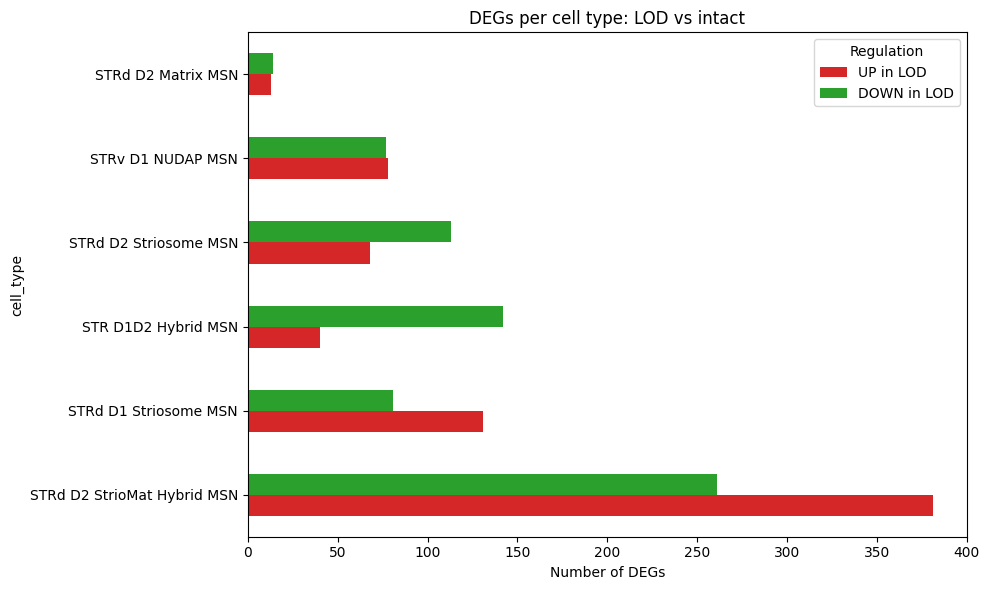

In [68]:
print(f"\n{'='*60}")
print(f"Total DEGs: {len(deg_lod_lod_vs_intact)}")
print(f"  UP in LOD: {(deg_lod_lod_vs_intact['direction']=='UP in LOD').sum()}")
print(f"  DOWN in LOD: {(deg_lod_lod_vs_intact['direction']=='DOWN in LOD').sum()}")
print(f"{'='*60}\n")


# ==========================================
# PLOT BY CELL TYPE
# ==========================================

for ct in deg_lod_lod_vs_intact["cell_type"].unique():
    
    df_ct = deg_lod_lod_vs_intact[deg_lod_lod_vs_intact["cell_type"] == ct]
    
    n_up = (df_ct["direction"] == "UP in LOD").sum()
    n_down = (df_ct["direction"] == "DOWN in LOD").sum()
    
    print(f"\n{'='*60}")
    print(f"{ct}: {len(df_ct)} DEGs (↑{n_up} / ↓{n_down})")
    print(f"{'='*60}")
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # --- Panel 1: Volcano plot ---
    colors = df_ct["logfoldchanges"].apply(lambda x: '#d62728' if x > 0 else '#2ca02c')
    axes[0].scatter(df_ct["logfoldchanges"], df_ct["-log10p"], c=colors, alpha=0.6, s=30)
    
    # Label top genes
    top_up = df_ct.nlargest(5, "logfoldchanges")
    top_down = df_ct.nsmallest(5, "logfoldchanges")
    for _, row in pd.concat([top_up, top_down]).iterrows():
        axes[0].text(row["logfoldchanges"], row["-log10p"], row["gene_symbol"], 
                    fontsize=8, alpha=0.8)
    
    axes[0].axhline(-np.log10(0.05), ls='--', c='gray', alpha=0.5)
    axes[0].axvline(1, ls='--', c='gray', alpha=0.5)
    axes[0].axvline(-1, ls='--', c='gray', alpha=0.5)
    axes[0].set_xlabel('Log2 FC')
    axes[0].set_ylabel('-log10(padj)')
    axes[0].set_title(f'Volcano: {ct}')
    
    # --- Panel 2: Top UP genes ---
    if n_up > 0:
        top_up = df_ct.nlargest(min(15, n_up), "logfoldchanges")
        axes[1].barh(range(len(top_up)), top_up["logfoldchanges"], color='#d62728')
        axes[1].set_yticks(range(len(top_up)))
        axes[1].set_yticklabels(top_up["gene_symbol"], fontsize=9)
        axes[1].set_xlabel('Log2 FC')
        axes[1].set_title(f'TOP {len(top_up)} UP in LOD')
        axes[1].invert_yaxis()
    else:
        axes[1].text(0.5, 0.5, 'No UP genes', ha='center', va='center')
        axes[1].set_title('UP in LOD')
    
    # --- Panel 3: Top DOWN genes ---
    if n_down > 0:
        top_down = df_ct.nsmallest(min(15, n_down), "logfoldchanges")
        axes[2].barh(range(len(top_down)), top_down["logfoldchanges"], color='#2ca02c')
        axes[2].set_yticks(range(len(top_down)))
        axes[2].set_yticklabels(top_down["gene_symbol"], fontsize=9)
        axes[2].set_xlabel('Log2 FC')
        axes[2].set_title(f'TOP {len(top_down)} DOWN in LOD')
        axes[2].invert_yaxis()
    else:
        axes[2].text(0.5, 0.5, 'No DOWN genes', ha='center', va='center')
        axes[2].set_title('DOWN in LOD')
    
    plt.suptitle(f'{ct}: {len(df_ct)} DEGs (↑{n_up} UP / ↓{n_down} DOWN)', 
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()


# ==========================================
# SUMMARY OVERVIEW
# ==========================================

# Summary table
summary = deg_lod_lod_vs_intact.groupby(["cell_type", "direction"]).size().unstack(fill_value=0)
summary["Total"] = summary.sum(axis=1)
summary = summary.sort_values("Total", ascending=False)

print("\n" + "="*60)
print("SUMMARY TABLE")
print("="*60)
print(summary)

# Summary bar plot
fig, ax = plt.subplots(figsize=(10, 6))
summary[["UP in LOD", "DOWN in LOD"]].plot(kind='barh', stacked=False, ax=ax, 
                                            color=['#d62728', '#2ca02c'])
ax.set_xlabel('Number of DEGs')
ax.set_title('DEGs per cell type: LOD vs intact')
ax.legend(title='Regulation')
plt.tight_layout()
plt.show()



# Cell cycle Regression ???

In [7]:
# Your current mapping (Ensembl → Symbol)
symbol_to_ensembl = adata.var["gene_symbol"].to_dict()
# This gives: {'ENSG00000243485': 'MIR1302-2HG', ...}

# What you NEED (Symbol → Ensembl)
ensembl_to_symbol = {symbol: ensembl for ensembl, symbol in symbol_to_ensembl.items()}
# This gives: {'MIR1302-2HG': 'ENSG00000243485', ...}

ensembl_to_symbol

{'MIR1302-2HG': 'ENSG00000243485',
 'ENSG00000290826': 'ENSG00000290826',
 'ENSG00000238009': 'ENSG00000238009',
 'ENSG00000239945': 'ENSG00000239945',
 'ENSG00000239906': 'ENSG00000239906',
 'ENSG00000241860': 'ENSG00000241860',
 'ENSG00000286448': 'ENSG00000286448',
 'ENSG00000290385': 'ENSG00000290385',
 'ENSG00000291215': 'ENSG00000291215',
 'ENSG00000229905': 'ENSG00000229905',
 'LINC01409': 'ENSG00000237491',
 'ENSG00000290784': 'ENSG00000290784',
 'FAM87B': 'ENSG00000177757',
 'LINC00115': 'ENSG00000225880',
 'LINC01128': 'ENSG00000228794',
 'ENSG00000288531': 'ENSG00000288531',
 'FAM41C': 'ENSG00000230368',
 'ENSG00000272438': 'ENSG00000272438',
 'ENSG00000230699': 'ENSG00000230699',
 'LINC02593': 'ENSG00000223764',
 'SAMD11': 'ENSG00000187634',
 'NOC2L': 'ENSG00000188976',
 'KLHL17': 'ENSG00000187961',
 'PLEKHN1': 'ENSG00000187583',
 'PERM1': 'ENSG00000187642',
 'ENSG00000272512': 'ENSG00000272512',
 'HES4': 'ENSG00000188290',
 'ISG15': 'ENSG00000187608',
 'ENSG00000224969': '

S genes found: 43/43
G2M genes found: 54/54

Cell cycle distribution:
phase
S      10475
G1      9567
G2M     9002
Name: count, dtype: int64


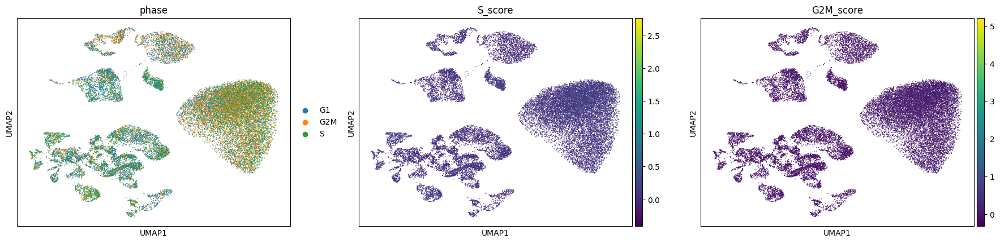

In [8]:
# ==========================================
# STEP 1: Score cell cycle genes
# ==========================================

s_genes = ['MCM5', 'PCNA', 'TYMS', 'FEN1', 'MCM2', 'MCM4', 'RRM1', 'UNG', 
                 'GINS2', 'MCM6', 'CDCA7', 'DTL', 'PRIM1', 'UHRF1', 'CENPU', 
                 'HELLS', 'RFC2', 'RPA2', 'NASP', 'RAD51AP1', 'GMNN', 'WDR76', 
                 'SLBP', 'CCNE2', 'UBR7', 'POLD3', 'MSH2', 'ATAD2', 'RAD51', 
                 'RRM2', 'CDC45', 'CDC6', 'EXO1', 'TIPIN', 'DSCC1', 'BLM', 
                 'CASP8AP2', 'USP1', 'CLSPN', 'POLA1', 'CHAF1B', 'BRIP1', 'E2F8']

g2m_genes = ['HMGB2', 'CDK1', 'NUSAP1', 'UBE2C', 'BIRC5', 'TPX2', 'TOP2A',
                   'NDC80', 'CKS2', 'NUF2', 'CKS1B', 'MKI67', 'TMPO', 'CENPF',
                   'TACC3', 'PIMREG', 'SMC4', 'CCNB2', 'CKAP2L', 'CKAP2', 'AURKB',
                   'BUB1', 'KIF11', 'ANP32E', 'TUBB4B', 'GTSE1', 'KIF20B', 'HJURP',
                   'CDCA3', 'JPT1', 'CDC20', 'TTK', 'CDC25C', 'KIF2C', 'RANGAP1',
                   'NCAPD2', 'DLGAP5', 'CDCA2', 'CDCA8', 'ECT2', 'KIF23', 'HMMR',
                   'AURKA', 'PSRC1', 'ANLN', 'LBR', 'CKAP5', 'CENPE', 'CTCF',
                   'NEK2', 'G2E3', 'GAS2L3', 'CBX5', 'CENPA']

# Convert symbols to Ensembl IDs
s_genes_ensembl = [ensembl_to_symbol.get(gene, None) for gene in s_genes]
g2m_genes_ensembl = [ensembl_to_symbol.get(gene, None) for gene in g2m_genes]

# Filter out None values (genes not found)
s_genes_present = [g for g in s_genes_ensembl if g is not None]
g2m_genes_present = [g for g in g2m_genes_ensembl if g is not None]

print(f"S genes found: {len(s_genes_present)}/{len(s_genes)}")
print(f"G2M genes found: {len(g2m_genes_present)}/{len(g2m_genes)}")

# Calculate scores
sc.tl.score_genes_cell_cycle(
    adata, 
    s_genes=s_genes_present, 
    g2m_genes=g2m_genes_present
)

# This adds to adata.obs:
# - 'S_score': S phase score
# - 'G2M_score': G2M phase score  
# - 'phase': Categorical (G1, S, G2M)

print("\nCell cycle distribution:")
print(adata.obs['phase'].value_counts())


# ==========================================
# STEP 2: Visualize BEFORE regression
# ==========================================

sc.pl.umap(adata, color=['phase', 'S_score', 'G2M_score'], ncols=3)

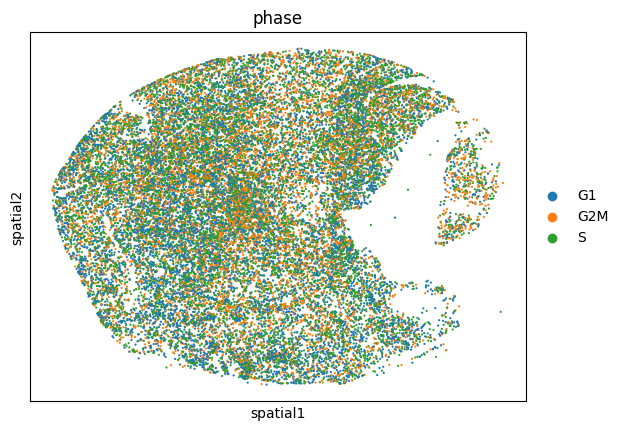

In [95]:
sc.pl.embedding(adata, basis="spatial", color=['phase'], ncols=3, size=10)

In [9]:
cell_cycle_genes = [*s_genes_present, *g2m_genes_present]
adata_cc_genes = adata[:, cell_cycle_genes].copy()
sc.tl.pca(adata_cc_genes, n_comps=min(50, len(cell_cycle_genes)-1),  svd_solver='arpack')
sc.pl.pca_scatter(adata_cc_genes, color="phase")

ValueError: Found array with 0 feature(s) (shape=(29044, 0)) while a minimum of 1 is required by PCA.

In [ ]:
# Your current mapping (Ensembl → Symbol)
symbol_to_ensembl = adata.var["gene_symbol"].to_dict()
# This gives: {'ENSG00000243485': 'MIR1302-2HG', ...}

# What you NEED (Symbol → Ensembl)
ensembl_to_symbol = {symbol: ensembl for ensembl, symbol in symbol_to_ensembl.items()}
# This gives: {'MIR1302-2HG': 'ENSG00000243485', ...}

ensembl_to_symbol

{'MIR1302-2HG': 'ENSG00000243485',
 'ENSG00000290826': 'ENSG00000290826',
 'ENSG00000238009': 'ENSG00000238009',
 'ENSG00000239945': 'ENSG00000239945',
 'ENSG00000239906': 'ENSG00000239906',
 'ENSG00000241860': 'ENSG00000241860',
 'ENSG00000286448': 'ENSG00000286448',
 'ENSG00000290385': 'ENSG00000290385',
 'ENSG00000291215': 'ENSG00000291215',
 'ENSG00000229905': 'ENSG00000229905',
 'LINC01409': 'ENSG00000237491',
 'ENSG00000290784': 'ENSG00000290784',
 'FAM87B': 'ENSG00000177757',
 'LINC00115': 'ENSG00000225880',
 'LINC01128': 'ENSG00000228794',
 'ENSG00000288531': 'ENSG00000288531',
 'FAM41C': 'ENSG00000230368',
 'ENSG00000272438': 'ENSG00000272438',
 'ENSG00000230699': 'ENSG00000230699',
 'LINC02593': 'ENSG00000223764',
 'SAMD11': 'ENSG00000187634',
 'NOC2L': 'ENSG00000188976',
 'KLHL17': 'ENSG00000187961',
 'PLEKHN1': 'ENSG00000187583',
 'PERM1': 'ENSG00000187642',
 'ENSG00000272512': 'ENSG00000272512',
 'HES4': 'ENSG00000188290',
 'ISG15': 'ENSG00000187608',
 'ENSG00000224969': '

In [91]:
adata_regressed_full = adata.copy()

sc.pp.regress_out(adata_regressed_full, ['S_score', 'G2M_score'], layer="log1p_norm")
sc.pp.scale(adata_regressed_full, max_value=10)

print("\n✓ Regressed out both S and G2M scores (removes all cell cycle)")

/home/gdallagl/myworkdir/XDP/.venv/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:199: RuntimeWarning: invalid value encountered in sqrt
  std = np.sqrt(var)



✓ Regressed out both S and G2M scores (removes all cell cycle)


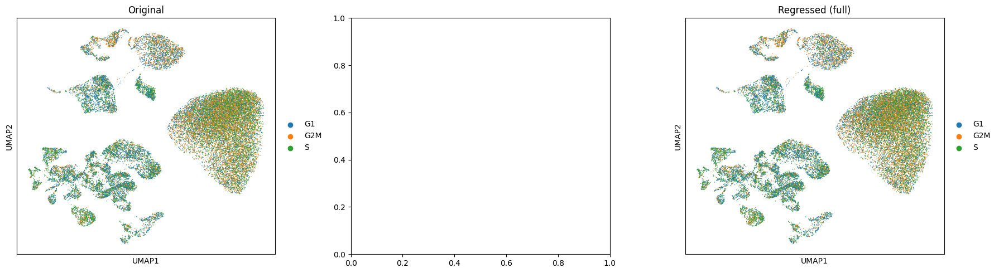

In [86]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

sc.pl.umap(adata, color='phase', title='Original', ax=axes[0], show=False)
sc.pl.umap(adata_regressed_full, color='phase', title='Regressed (full)', ax=axes[2], show=False)

plt.tight_layout()
plt.show()

In [93]:
cc_by_region = pd.crosstab(adata.obs['LOD_region'], adata.obs['phase'], normalize='index')
display(cc_by_region)


# Statistical test
from scipy.stats import chi2_contingency

cc_by_region = pd.crosstab(adata.obs['LOD_region'], adata.obs['phase'])
chi2, pval, dof, expected = chi2_contingency(cc_by_region)

print(f"Chi-squared test: p = {pval:.4e}")
if pval < 0.05:
    print("⚠️ Cell cycle SIGNIFICANTLY differs between regions!")
else:
    print("✓ No significant difference in cell cycle")

phase,G1,G2M,S
LOD_region,,,
LOD,0.330042,0.335214,0.334744
degenerated,0.295789,0.333844,0.370368
intact,0.360973,0.283539,0.355488


Chi-squared test: p = 1.9503e-32
⚠️ Cell cycle SIGNIFICANTLY differs between regions!


# Squidpy

In [ ]:
# ==========================================
# SQUIDPY HAS BUILT-IN SPATIAL ANALYSIS!
# ==========================================

import squidpy as sq

# Squidpy has several relevant functions:

# --------------------------------------------------
# 1. Spatial Statistics (Ripley's K, etc.)
# --------------------------------------------------
sq.gr.ripley(
    adata,
    cluster_key=CELL_TYPE_COL,
    mode="K"  # or "L", "G"
)
# → Tests if cell types are clustered or dispersed

# --------------------------------------------------
# 2. Co-occurrence (which cell types are neighbors?)
# --------------------------------------------------
sq.gr.co_occurrence(
    adata,
    cluster_key=CELL_TYPE_COL,
    spatial_key="spatial"
)
# → Creates matrix of cell type co-occurrence

# --------------------------------------------------
# 3. Neighborhood Enrichment
# --------------------------------------------------
sq.gr.nhood_enrichment(
    adata,
    cluster_key=CELL_TYPE_COL,
    spatial_key="spatial"
)

sq.pl.nhood_enrichment(adata, cluster_key=CELL_TYPE_COL)
# → Shows which cell types are enriched near each other

# --------------------------------------------------
# 4. Spatial Autocorrelation (Moran's I)
# --------------------------------------------------
sq.gr.spatial_autocorr(
    adata,
    mode="moran",
    n_perms=100,
    genes=adata.var_names[:100]  # Test specific genes
)
# → Tests if gene expression is spatially clustered

# --------------------------------------------------
# 5. Interaction Matrix
# --------------------------------------------------
sq.gr.interaction_matrix(
    adata,
    cluster_key=CELL_TYPE_COL,
    spatial_key="spatial"
)
# → Quantifies spatial interactions between cell types


# Only Neurons

In [ ]:
adata_n = adata[adata.]

# Save Notebook

<IPython.core.display.Javascript object>